In [1]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
print("Num GPUs:", len(physical_devices))
tf.config.set_visible_devices(physical_devices[2], 'GPU')

from keras.callbacks import ModelCheckpoint
from keras.callbacks import LearningRateScheduler
import keras.backend as K
from keras.optimizers import Adam
from keras.utils import to_categorical

import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import albumentations as A
import random

from deep_globe_segmentation import models, dataset_utils as dataset, plot_utils as plt

2024-01-16 15:53:33.101771: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-16 15:53:33.622876: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/buu3clj/radar_ws/tf211-env/lib/
2024-01-16 15:53:33.622918: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/buu3clj/radar_ws/tf211-env/lib/
2024-01-16 15:53:33.622922: W tensorflow/compiler/tf2t

Num GPUs: 4


In [2]:
input_folder = '/home/buu3clj/radar_ws/deep_globe_segmentation/dataset/cropped_dataset'
weights_path_resnet50 = '/home/buu3clj/radar_ws/deep_globe_segmentation/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'
weights_path_inception_resnet_v2 = '/home/buu3clj/radar_ws/deep_globe_segmentation/inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5'
output_folder = '/home/buu3clj/radar_ws/deep_globe_segmentation/models'

In [3]:
image_files = [filename for filename in os.listdir(input_folder) if filename.endswith('.jpg')]
mask_files = [filename for filename in os.listdir(input_folder) if filename.endswith('.png')]

image_files.sort()
mask_files.sort()

combined = list(zip(image_files, mask_files))
random.shuffle(combined)
image_files[:], mask_files[:] = zip(*combined)

image_files_train, image_files_val, mask_files_train, mask_files_val = train_test_split(
    image_files, mask_files, test_size=0.3, random_state=42, shuffle=True)

In [4]:
num_classes = 7
colors = [
    [0, 255, 255],   # urban_land
    [255, 255, 0],   # agriculture_land
    [255, 0, 255],   # rangeland
    [0, 255, 0],     # forest_land
    [0, 0, 255],     # water
    [255, 255, 255], # barren_land
    [0, 0, 0]        # unknown
]
class_names = [
    "Urban Land",
    "Agriculture Land",
    "Rangeland",
    "Forest Land",
    "Water",
    "Barren Land",
    "Unknown"
]

In [5]:
class_weights = dataset.calculate_class_weights(mask_files, colors, input_folder)
class_weights[6] = 1 # Unknown weight should be 1
print("Class Weights:", class_weights),

Class Weights: {0: 1.3908685526065514, 1: 0.24779873855539716, 2: 1.581703045618714, 3: 1.3963168001957018, 4: 4.013703206270928, 5: 1.5568543438690847, 6: 1}


(None,)

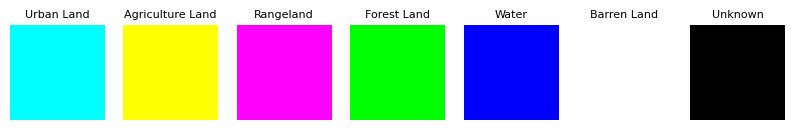

In [6]:
plt.display_color_classes(colors, class_names)

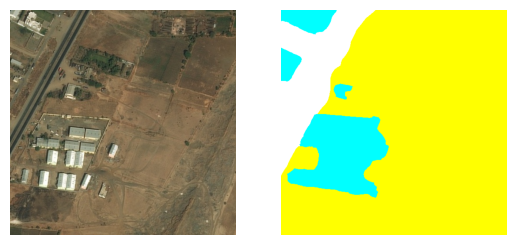

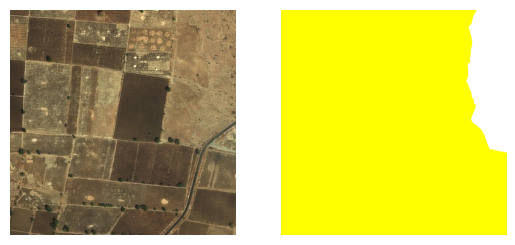

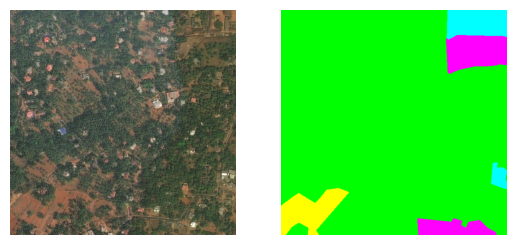

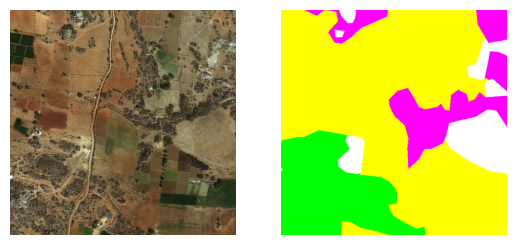

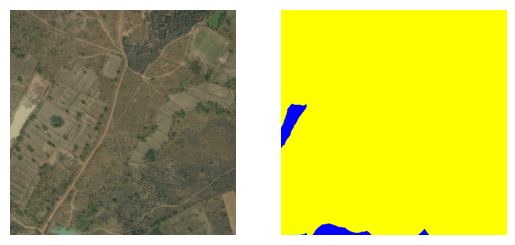

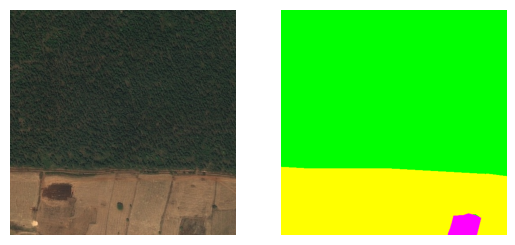

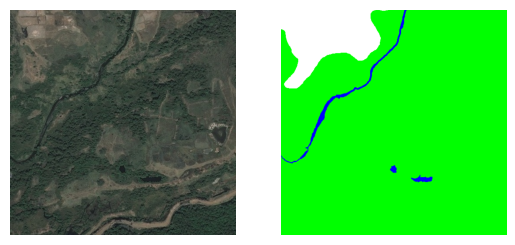

In [7]:
plt.plot_images_and_masks(input_folder, image_files_train[:7], mask_files_train[:7], load=True)

In [8]:
spatial_augmentation = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
])

color_augmentation = A.Compose([
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    A.HueSaturationValue(hue_shift_limit=15, sat_shift_limit=25, val_shift_limit=15, p=0.5),
])

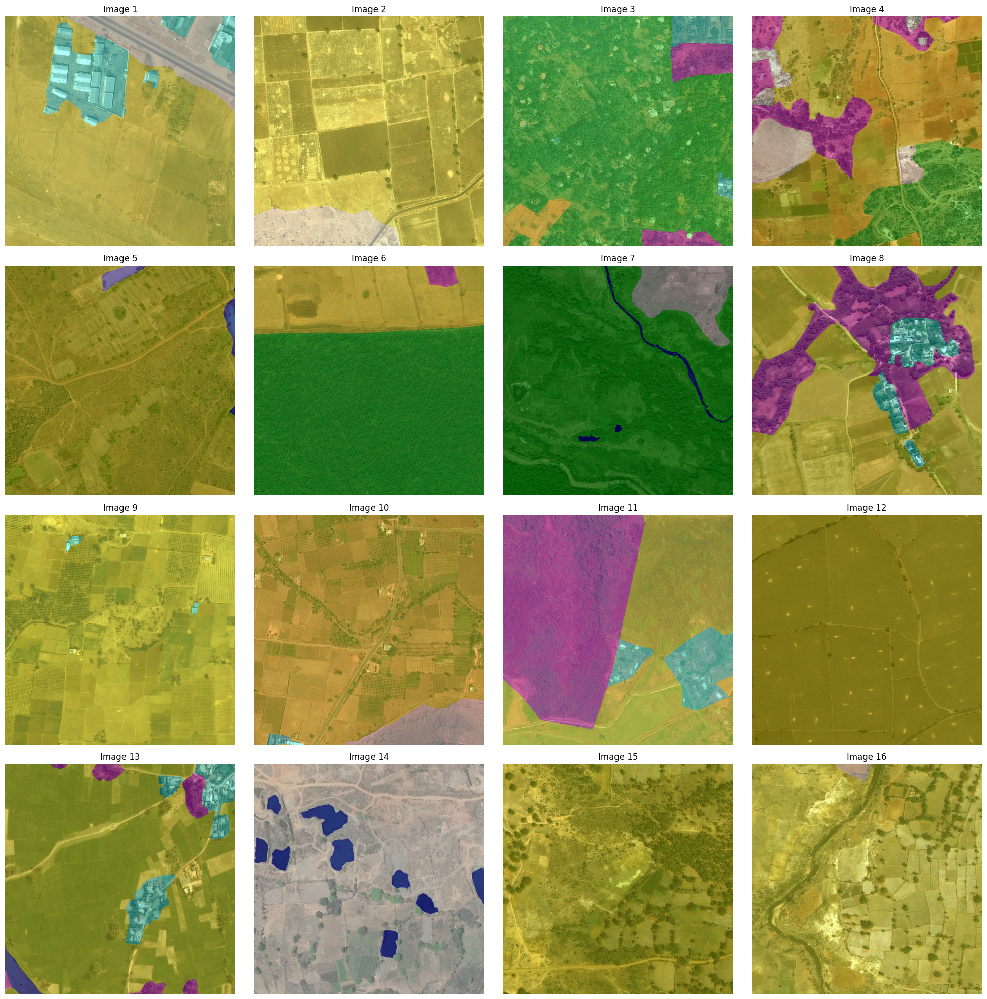

In [9]:
data_gen = dataset.data_generator(input_folder, colors, image_files_train, mask_files_train, 16, num_classes, spatial_augmentation, color_augmentation)
images, masks = next(data_gen)

plt.plot_images_with_overlaid_masks(images, masks, colors)

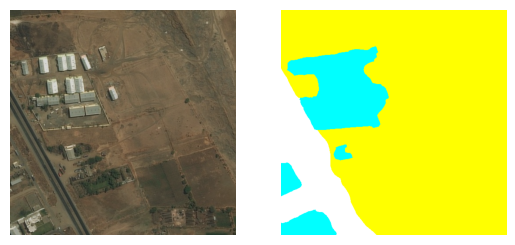

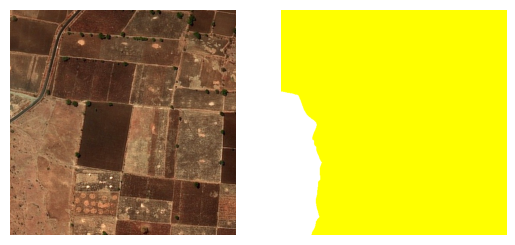

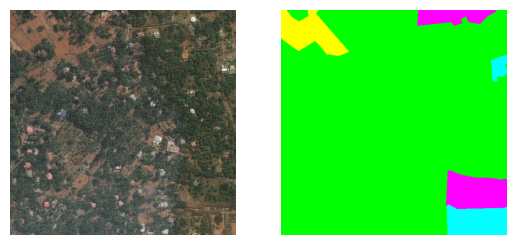

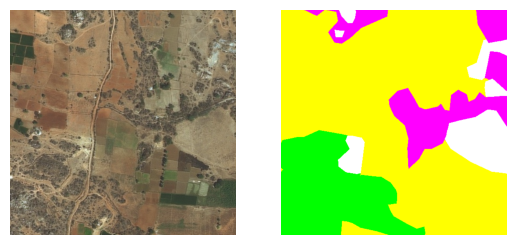

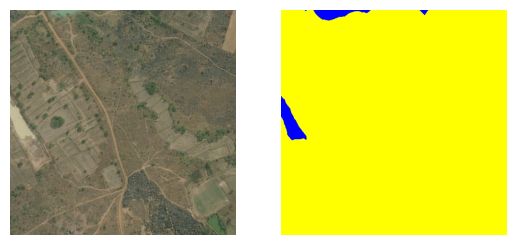

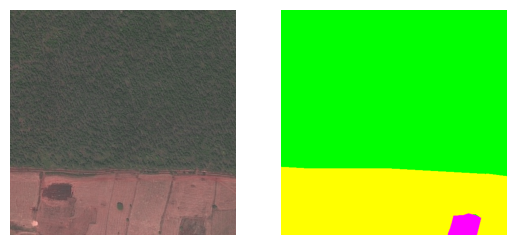

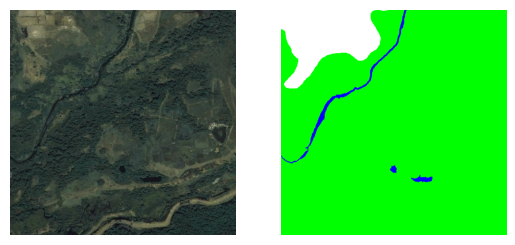

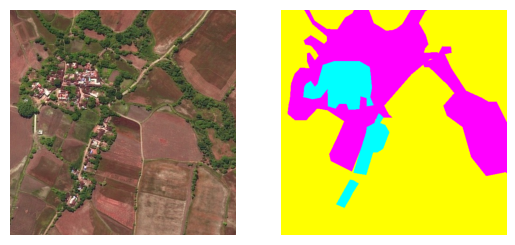

In [10]:
data_gen = dataset.data_generator(input_folder, colors, image_files_train, mask_files_train, 8, num_classes, spatial_augmentation, color_augmentation)
images, masks = next(data_gen)
masks = [dataset.one_hot_to_rgb(mask, colors) for mask in masks]
plt.plot_images_and_masks(input_folder, images, masks)

In [11]:
model = models.build_inception_resnetv2_unet((512,512,3), num_classes, weights_path_inception_resnet_v2)
# model = models.build_resnet50_unet_v2((512,512,3), num_classes, weights_path_resnet50)

model.compile(optimizer=Adam(learning_rate=0.00005), loss=models.weighted_dice_loss(class_weights), metrics=['accuracy'])
# model.compile(optimizer=Adam(slearning_rate=0.00005), loss=models.dice_loss, metrics=['accuracy'])

print(model.summary())

2024-01-16 15:54:47.869053: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-16 15:54:47.873620: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-16 15:54:47.874684: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-01-16 15:54:47.875663: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least on

Model: "InceptionResNetV2-UNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 255, 255, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 255, 255, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                            

In [12]:
def scheduler(epoch, lr):
    if epoch < 3:
        return lr
    else:
        return lr * 0.85

lr_scheduler = LearningRateScheduler(scheduler)

checkpoint = ModelCheckpoint(
    os.path.join(output_folder, 'best_model_resnet50.h5'),
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

In [13]:
batch_size = 8

data_gen_train = dataset.data_generator(input_folder, colors, image_files_train, mask_files_train, batch_size, num_classes, spatial_augmentation, color_augmentation)
data_gen_val = dataset.data_generator(input_folder, colors, image_files_val, mask_files_val, batch_size, num_classes, spatial_augmentation, color_augmentation)

history = model.fit(
    data_gen_train,
    validation_data=data_gen_val,
    epochs=20,
    steps_per_epoch=len(image_files_train) // batch_size,
    validation_steps=len(image_files_val) // batch_size,
    callbacks=[lr_scheduler, checkpoint]
)

Epoch 1/20


2024-01-16 15:54:59.033994: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inInceptionResNetV2-UNet/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-01-16 15:55:01.436256: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8100
2024-01-16 15:55:02.491534: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:630] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


137/137 [==============================] - ETA: 0s - loss: 1.2767 - accuracy: 0.3053
Epoch 1: val_loss improved from inf to 1.22311, saving model to /home/buu3clj/radar_ws/deep_globe_segmentation/models/best_model_resnet50.h5
137/137 [==============================] - 137s 887ms/step - loss: 1.2767 - accuracy: 0.3053 - val_loss: 1.2231 - val_accuracy: 0.5252 - lr: 5.0000e-05
Epoch 2/20
137/137 [==============================] - ETA: 0s - loss: 1.0700 - accuracy: 0.5881
Epoch 2: val_loss improved from 1.22311 to 1.00728, saving model to /home/buu3clj/radar_ws/deep_globe_segmentation/models/best_model_resnet50.h5
137/137 [==============================] - 124s 880ms/step - loss: 1.0700 - accuracy: 0.5881 - val_loss: 1.0073 - val_accuracy: 0.7089 - lr: 5.0000e-05
Epoch 3/20
137/137 [==============================] - ETA: 0s - loss: 0.9710 - accuracy: 0.6663
Epoch 3: val_loss improved from 1.00728 to 0.93003, saving model to /home/buu3clj/radar_ws/deep_globe_segmentation/models/best_model_

In [14]:
with tf.keras.utils.custom_object_scope({'dice_loss': models.dice_loss, 'weighted_dice_loss': models.weighted_dice_loss(class_weights)}):
    model = tf.keras.models.load_model(os.path.join(output_folder, 'best_model_resnet50.h5'))

Overall Classification Report:
                  precision    recall  f1-score   support

      Urban Land       0.86      0.83      0.84  13702588
Agriculture Land       0.93      0.84      0.88  70253496
       Rangeland       0.45      0.53      0.49  12011617
     Forest Land       0.74      0.87      0.80  12121050
           Water       0.85      0.83      0.84   4956830
     Barren Land       0.62      0.79      0.69  10605193
         Unknown       0.00      0.00      0.00     81194

        accuracy                           0.81 123731968
       macro avg       0.63      0.67      0.65 123731968
    weighted avg       0.83      0.81      0.81 123731968

Overall Confusion Matrix:
[[11411899   883757   679330   139484    12827   575291        0]
 [  889883 59091442  5088099  2129826   389606  2664638        2]
 [  631403  2482756  6413838   905727   179806  1398086        1]
 [    5481   186474  1155471 10599506    44234   129884        0]
 [   88104   190085   213301    17658 

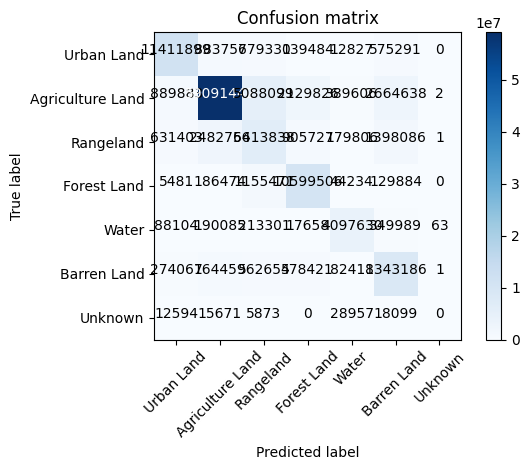

In [15]:
batch_size = 8
test_gen = dataset.data_generator(input_folder, colors, image_files_val, mask_files_val, batch_size, num_classes, spatial_augmentation, color_augmentation)

all_true_labels = []
all_pred_labels = []

num_batches = len(image_files_val) // batch_size

for i, (images, true_masks) in enumerate(test_gen):
    if i >= num_batches:
        break

    pred_masks = model.predict(images, verbose=0)

    true_labels = np.argmax(true_masks, axis=-1).flatten()
    pred_labels = np.argmax(pred_masks, axis=-1).flatten()

    all_true_labels.append(true_labels)
    all_pred_labels.append(pred_labels)

y_true = np.concatenate(all_true_labels)
y_pred = np.concatenate(all_pred_labels)

print("Overall Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred, labels=range(num_classes))
print("Overall Confusion Matrix:")
print(cm)
plt.plot_confusion_matrix(cm, classes=class_names)

Class-wise Metrics:
                  precision    recall  f1-score   support

      Urban Land       0.86      0.83      0.84  13702588
Agriculture Land       0.93      0.84      0.88  70253496
       Rangeland       0.45      0.53      0.49  12011617
     Forest Land       0.74      0.87      0.80  12121050
           Water       0.85      0.83      0.84   4956830
     Barren Land       0.62      0.79      0.69  10605193
         Unknown       0.00      0.00      0.00     81194

        accuracy                           0.81 123731968
       macro avg       0.63      0.67      0.65 123731968
    weighted avg       0.83      0.81      0.81 123731968



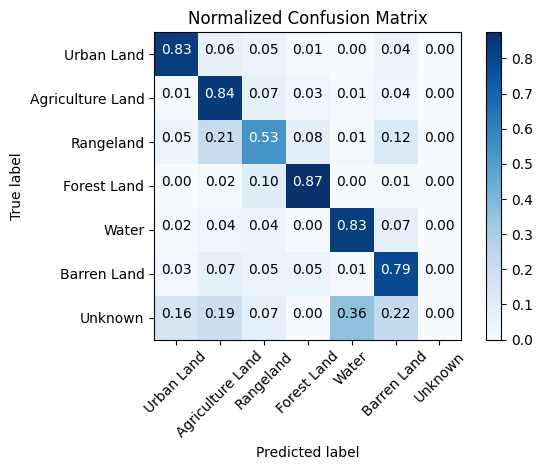

In [16]:
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.plot_confusion_matrix(cm_normalized, classes=class_names, title='Normalized Confusion Matrix')

print("Class-wise Metrics:")
print(classification_report(y_true, y_pred, target_names=class_names))

In [17]:
def dice_coefficient(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

dice_scores = []
for i in range(num_classes):
    y_true_categorical = to_categorical(y_true, num_classes)
    y_pred_categorical = to_categorical(y_pred, num_classes)
    
    dice_score = dice_coefficient(y_true_categorical[:, i], y_pred_categorical[:, i])
    dice_scores.append(dice_score)
    print(f"Dice Coefficient for Class {class_names[i]}: {dice_score}")

Dice Coefficient for Class Urban Land: 0.8448249101638794
Dice Coefficient for Class Agriculture Land: 0.8828305602073669
Dice Coefficient for Class Rangeland: 0.49091413617134094
Dice Coefficient for Class Forest Land: 0.8002141714096069
Dice Coefficient for Class Water: 0.8369085192680359
Dice Coefficient for Class Barren Land: 0.6928300261497498
Dice Coefficient for Class Unknown: 1.230587440659292e-05


1/1 [==============================] - 6s 6s/step


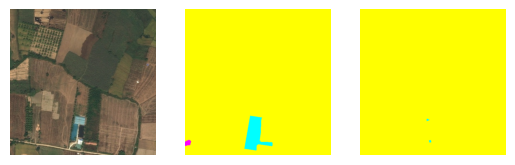

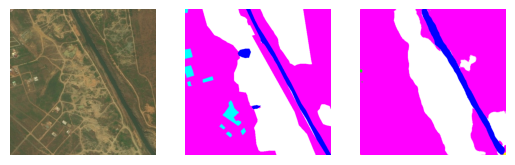

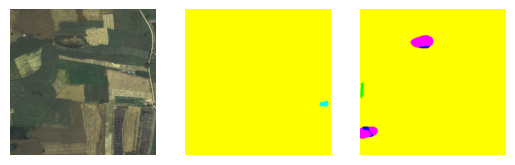

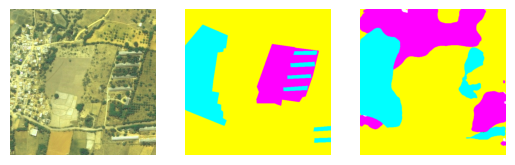

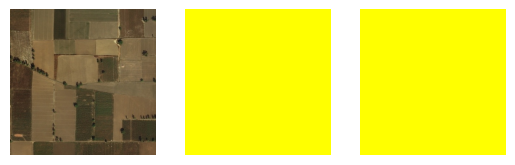

...

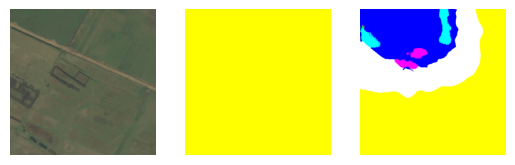

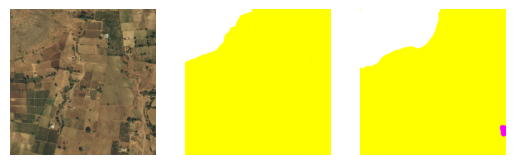

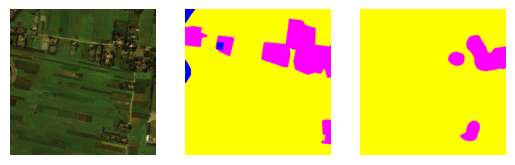

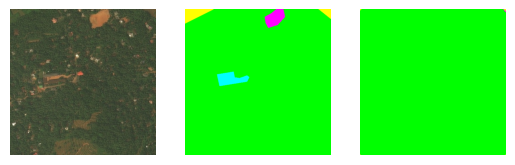

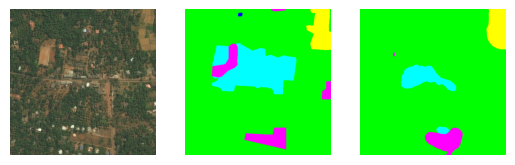

In [18]:
batch_size = 32
data_gen = dataset.data_generator(input_folder, colors, image_files_val, mask_files_val, batch_size, num_classes, spatial_augmentation, color_augmentation)

images, masks = next(data_gen)

predicted_masks = model.predict(images)

masks = [dataset.one_hot_to_rgb(mask, colors) for mask in masks]
predicted_masks = [dataset.one_hot_to_rgb(predicted_mask, colors) for predicted_mask in predicted_masks]

plt.plot_images_and_masks(input_folder, images, masks, predicted_masks, load=False)